In [1]:
%matplotlib widget
import pathlib
import os

import cv2
from matplotlib import pyplot as plt
import numpy as np

base_path = pathlib.Path().resolve()
imgs_path = base_path / "tet"

failed_path = base_path / "failed"
detected_path = base_path / "detected"



In [2]:
# 28cm = 11,0236
#  at 300dpi
dpcm = 300 * 0.393701
# 46cm = 18,1102
cell_size=10000
num_boards = 4
m, n = 3, 5

dictionary = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_5X5_1000)
board = cv2.aruco.CharucoBoard_create(m, n, .09, .075, dictionary)
params = cv2.aruco.DetectorParameters_create()

# plt.figure(figsize=(10, 2))
# for i in range(num_boards):
#     board.ids += i*7
#     #img = board.draw(outSize=(int(m*0.09*cell_size), int(n*0.09*cell_size)), marginSize=int((0.28 - m*0.09)*cell_size/2))
#     img = board.draw(outSize=(int(28*dpcm), int(46*dpcm)), marginSize=int(0.5*dpcm))
#     cv2.imwrite(f"{str(base_path)}/charuco_5p5_1000_{i}.png", img)
#     ax = plt.subplot(1, num_boards, i+1)
#     ax.imshow(img, cmap='gray')
#     ax.axis('off')
# plt.show()


Sucess


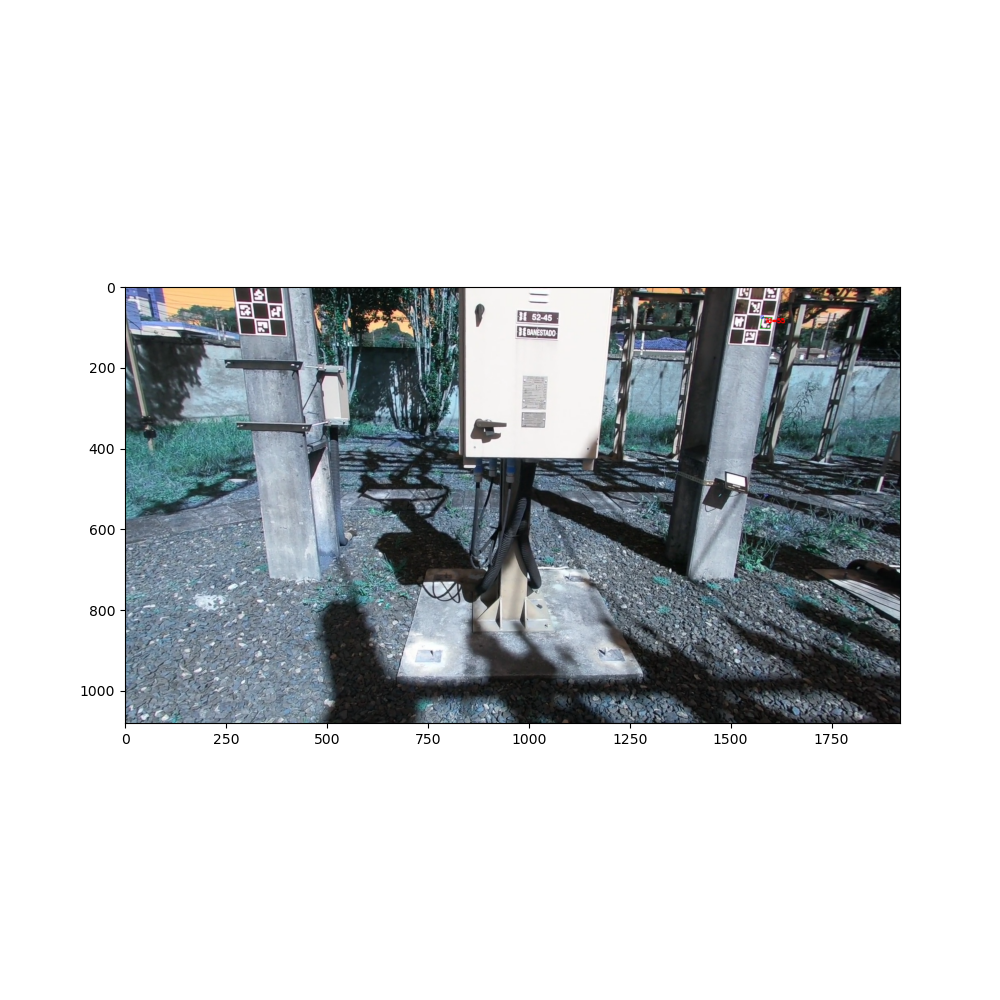

Sucess


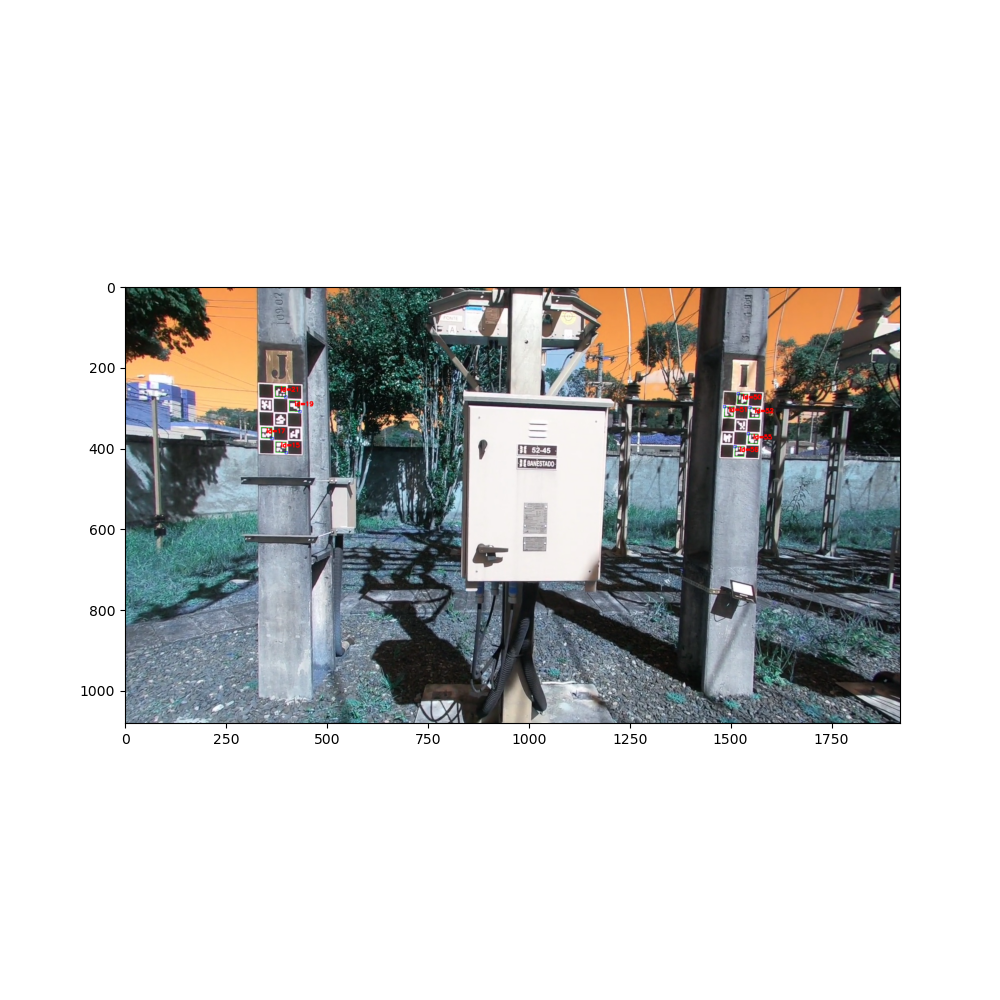

Sucess


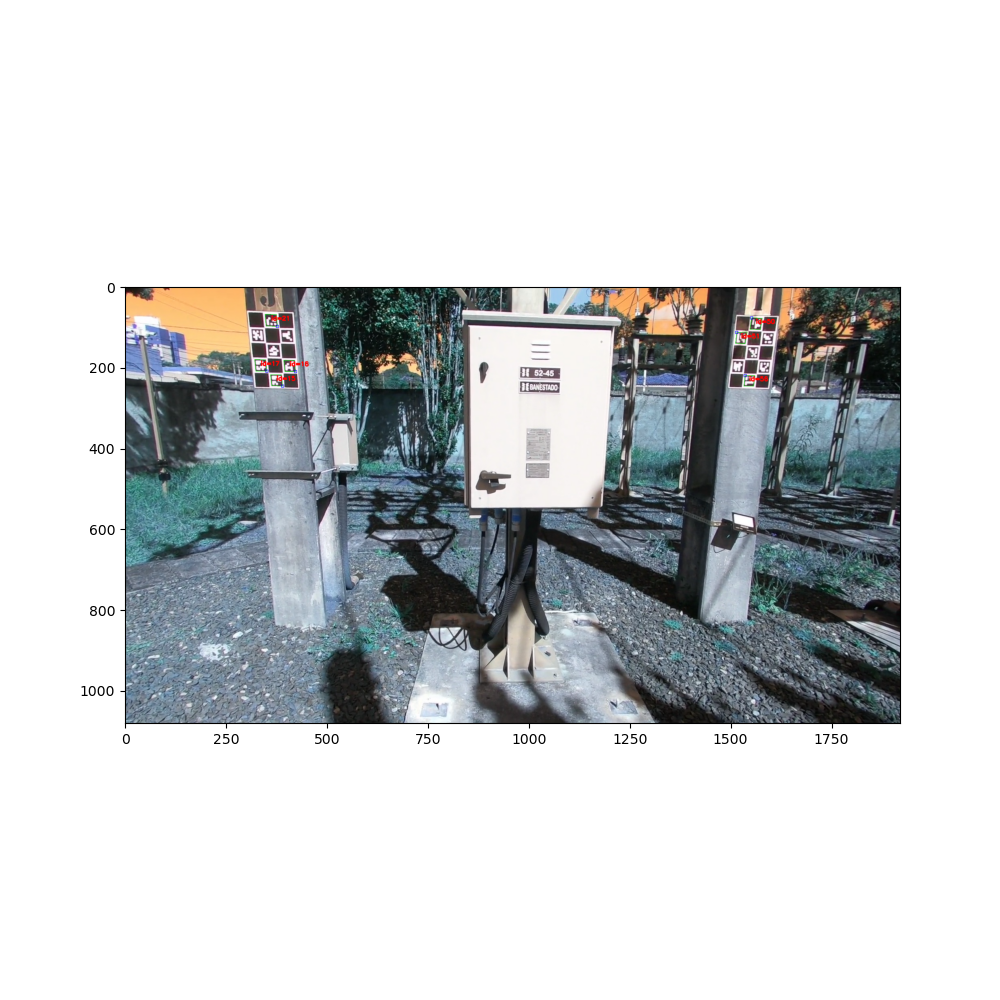

Sucess


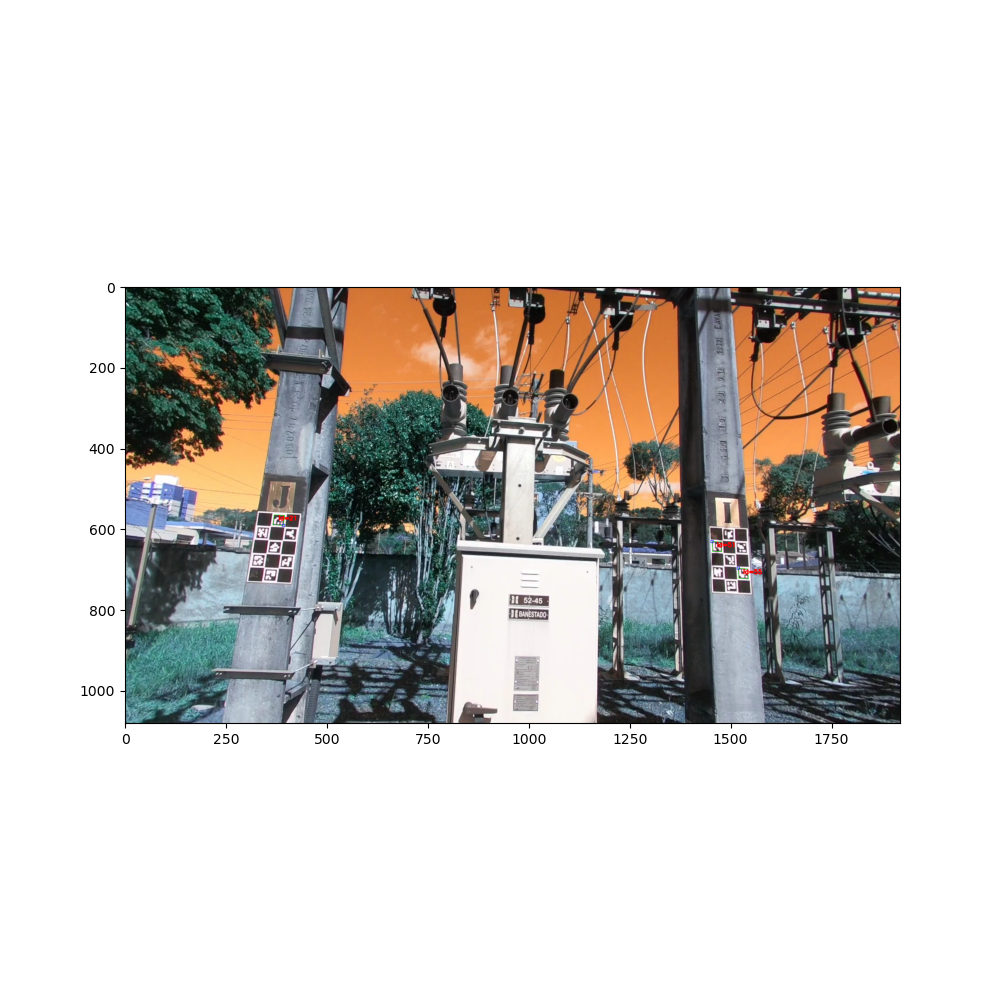

Sucess


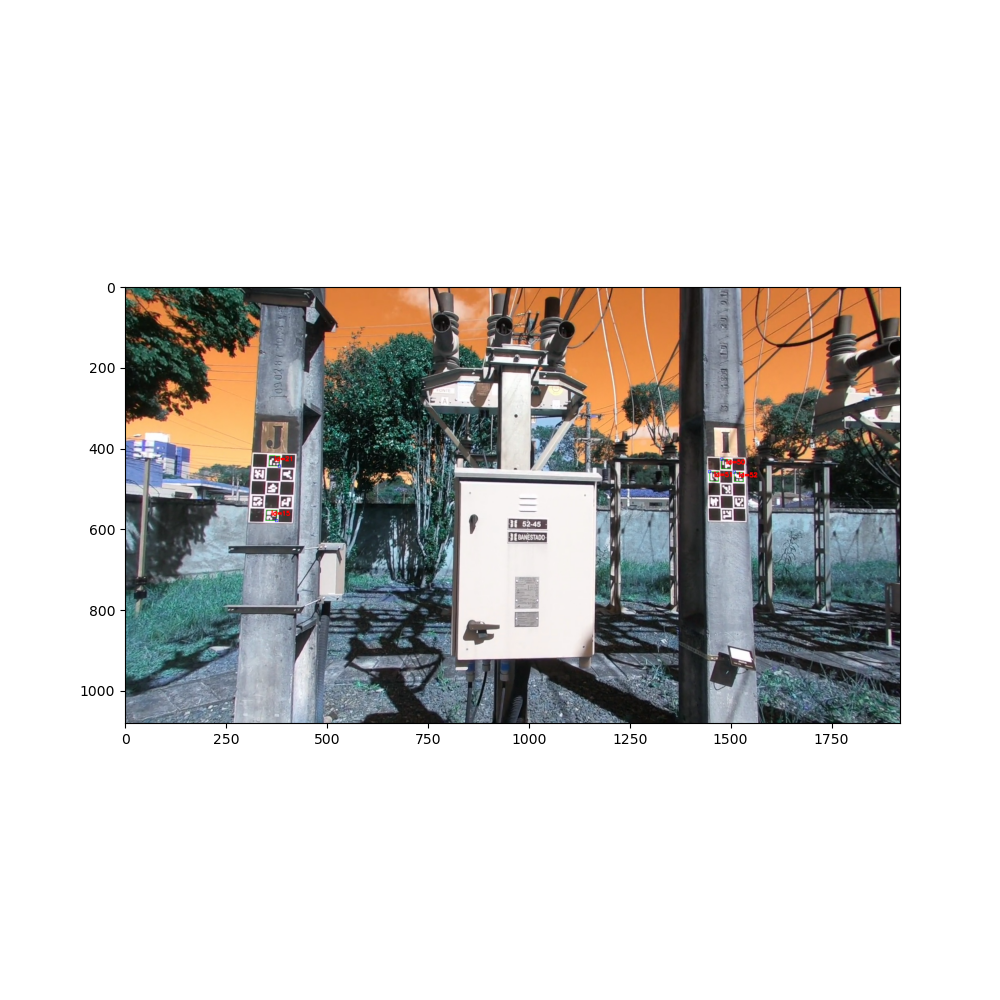

Sucess


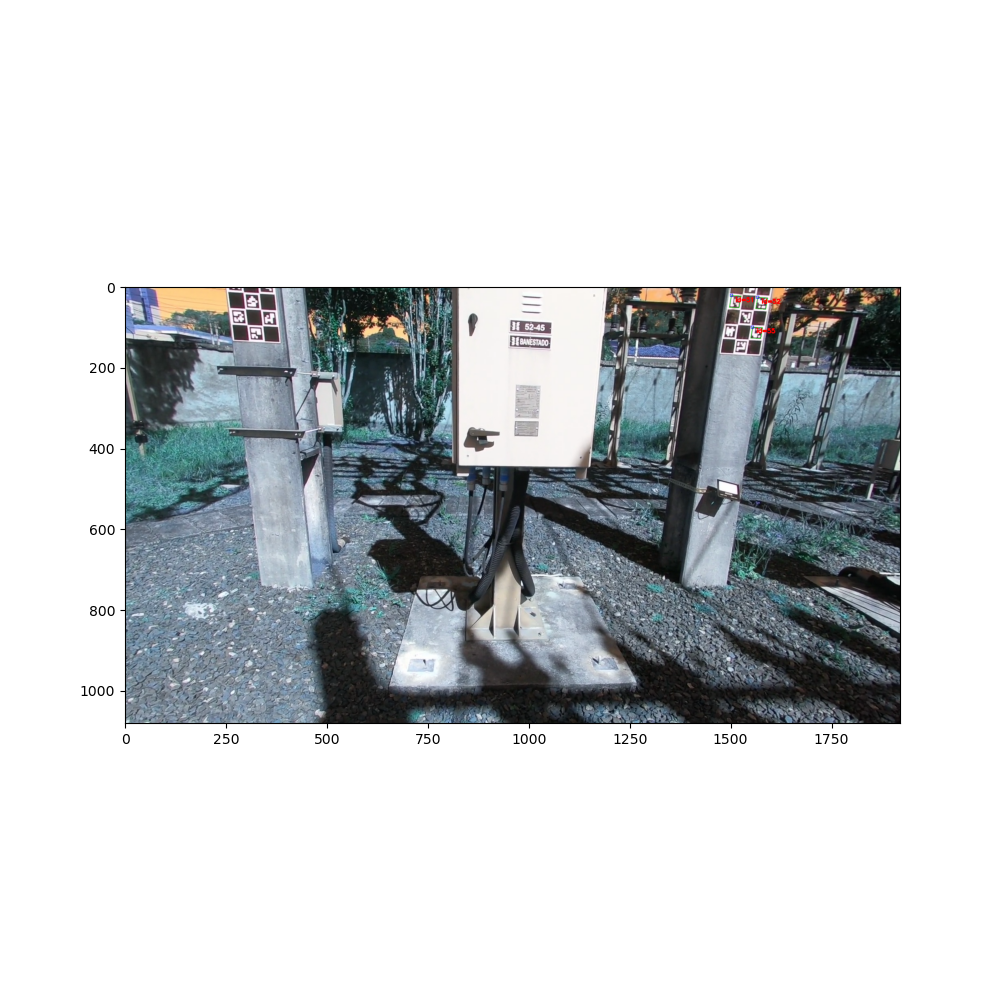

In [3]:
params.cornerRefinementMethod = cv2.aruco.CORNER_REFINE_NONE

for image in os.listdir(imgs_path):
    #img_bgr = cv2.imread(str(imgs_path / 'P1_C3_X334_Y0_Z37_A7_E13_rgb_HD.jpg'), cv2.IMREAD_COLOR)
    img_bgr = cv2.imread(str(imgs_path / image), cv2.IMREAD_COLOR)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    m_corners, m_ids, rejected_pts = cv2.aruco.detectMarkers(img_gray, dictionary, parameters=params)
    if m_ids is not None and len(m_ids) > 0:
        print("Sucess")
        img = cv2.aruco.drawDetectedMarkers(img_bgr, m_corners, m_ids)
        os.chdir(detected_path)
        cv2.imwrite(image, img)
        #board.setIds(np.array([105, 106, 107, 108]))
        ok, c_corners, c_ids = cv2.aruco.interpolateCornersCharuco(m_corners, m_ids, img_gray, board)
        if c_ids is not None and len(c_ids) > 0:
            img = cv2.aruco.drawDetectedCornersCharuco(img, c_corners, c_ids, (0, 255, 0))
            os.chdir(detected_path)
            cv2.imwrite(image, img)
        plt.figure(figsize=(10,10))
        plt.imshow(img)
        plt.show()
    else:
        print("Fail")
        img = cv2.aruco.drawDetectedMarkers(img_bgr, rejected_pts)
        os.chdir(failed_path)
        cv2.imwrite(image, img)
        plt.figure(figsize=(10,10))
        plt.imshow(img)
        plt.show()
